# Convert images to NIfTI

In [1]:
# Make Nifti1Image from the segmentation results

#DATA PATH
data_path = "/home/jovyan/Project/ACDC/database"
# data_path = "/home/jovyan/Project/Val/Test"



In [2]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import glob
import monai
from PIL import Image
import torch
import nibabel as nib
from skimage import metrics
from sklearn.metrics import jaccard_score
import scipy.ndimage as ndi
from monai.config import print_config
from monai.utils import first
from monai.config import KeysCollection
from monai.data import Dataset, ArrayDataset, create_test_image_3d, DataLoader
from monai.transforms import (
    Transform,
    MapTransform,
    Randomizable,
    AddChannel,
    AddChanneld,
    CastToTyped,
    Compose,
    EnsureChannelFirst,
    LoadImage,
    LoadImaged,
    Lambda,
    Lambdad,
    RandSpatialCrop,
    RandSpatialCropd,
    Resize,
    ToTensor,
    ToTensord,
    Orientation, 
    Rotate,
    RandFlipd,
    RandAffined,
    RandGaussianNoised,
    RandRotated
)
import random
import math
import torch

In [3]:
# Build function that writes list of paths to images automatically, based on the root folder of the data and the filename structure:
def build_dict(data_path, mode):
    dicts = [] 
    list_img = []
    patient_folders = glob.glob(os.path.join(data_path, mode, 'patient*'))

    for patient_folder in patient_folders:
        patient_id = os.path.basename(patient_folder)
        all_paths = glob.glob(os.path.join(patient_folder, f'{patient_id}_frame*.nii.gz')) # path to all 'frame' image files (both mask and img)
        
        frame_indices = sorted(list(set([os.path.basename(path).split('_frame')[-1].split('.')[0] for path in all_paths])))
        for i in range(0,len(frame_indices),2): # loop over every other frame index since you only want the number (and also got '_gt' in frame_indices)
            frame_index = frame_indices[i]
            if frame_index != '01':
                img_ED = f'{patient_id}_frame{frame_index}.nii.gz' # diastole images are always frame 01
                mask_ED = f'{patient_id}_frame{frame_index}_gt.nii.gz'
                ED_img_path = os.path.join(patient_folder,img_ED)
                ED_mask_path = os.path.join(patient_folder,mask_ED)
        dicts.append({'ED_img': ED_img_path})#, 'ES_img': ES_img_path})#,'time_img':time_path})  
    return dicts

test_dict = build_dict(data_path, 'testing')
print(len(test_dict))


50


In [4]:
# Make a monai transform that loads the data from the dataset (so it retrieves the image via the path)
class LoadData(monai.transforms.Transform):
    def __init__(self, keys=None):
        pass

    def __call__(self, sample):
        ED_image = nib.load(sample['ED_img']).get_fdata().astype(np.float64) 
        # ES_image = nib.load(sample['ES_img']).get_fdata().astype(np.float64) 


        # The function then returns the images and corresponding binary masks containing all 4 labels
        return {'ED_img': ED_image[:,:,:]}
        # return {'ED_img': ED_image[:,:,:,0]}
                

In [5]:
# Data augmentation and making datasets for training and validation:

# Define the keys so that the transforms can be split into images and masks (needed for the randrotated)
# Make sure the sizes correspond to the transformations applied on the data with which you got the results!
keys_img = ['ED_img']
max_size = [512, 512, 16]
roi_size = [336, 336, 16] 

# Only the necessary transforms to be able to load the data into the UNet. This will be applied to all keys present: 
T_test = monai.transforms.Compose([
    LoadData(),
    monai.transforms.AddChanneld(keys=test_dict[0].keys()),
    monai.transforms.ScaleIntensityd(keys = keys_img, minv = 0, maxv = 1),
    monai.transforms.Resized(keys=test_dict[0].keys(),size_mode='all',spatial_size=max_size, mode= 'nearest'), # resize to the largest dimension present in the original images    
    monai.transforms.CenterSpatialCropd(keys=test_dict[0].keys(),roi_size=roi_size), # crop the images so that the UNet trains more quickly
])

test_dataset_T = monai.data.Dataset(test_dict, transform = T_test)
# val_dataset_T = monai.data.Dataset(val_dict, transform = T_test)
print(len(test_dataset_T))


50


<class 'monai.transforms.utility.array.AddChannel'>: Class `AddChannel` has been deprecated since version 0.8. please use MetaTensor data type and monai.transforms.EnsureChannelFirst instead.


In [6]:
# Make dataloaders without shuffle and with batch size 1, so that the model gets one image per batch and so that the patient ID's of the images and segmentation results can be matched
batch_size = 1
test_dataloader = DataLoader(test_dataset_T, batch_size=batch_size,shuffle=False) # create batches of 1 image (not shuffled)


In [7]:
# load previously trained model, specify cuda and specify exactly the same model as used to get segmentation results
device = torch.device("cuda:7" if torch.cuda.is_available() else "cpu")
print(f'The used device is {device}')

# Load the model
model = monai.networks.nets.UNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=3,
    channels=(8, 16, 32, 64, 128),
    strides=(2, 2, 2, 2),
    num_res_units=2,
).to(device)

lr = 1e-3
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
loss_function =  monai.losses.DiceCELoss(sigmoid=True, batch=True)


# MODEL PATH
checkpoint = torch.load('/home/jovyan/Project/Clean/ACDCtrainedUNet_ES_lr_0.001_6_14_34_30_20.pt',map_location = torch.device(device))
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])


The used device is cuda:7


0


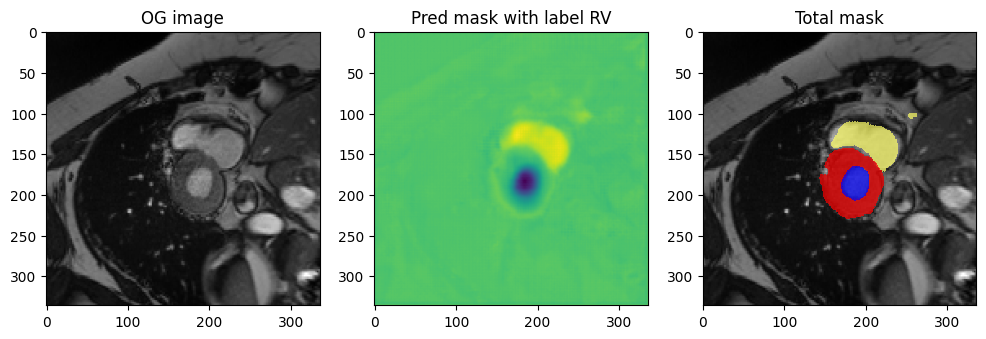

0


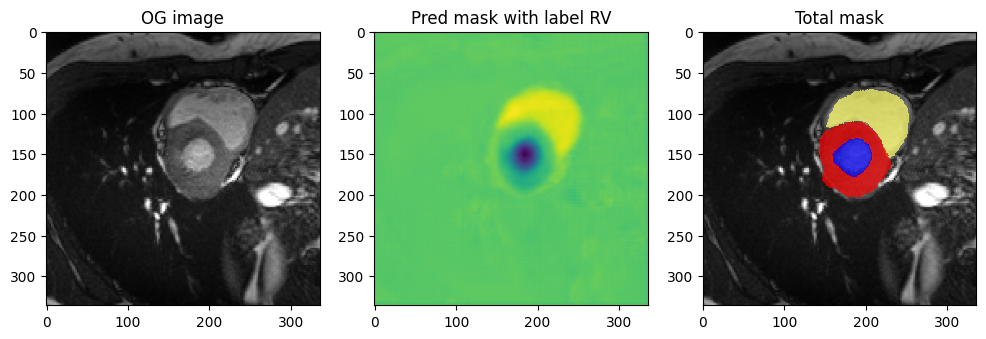

0


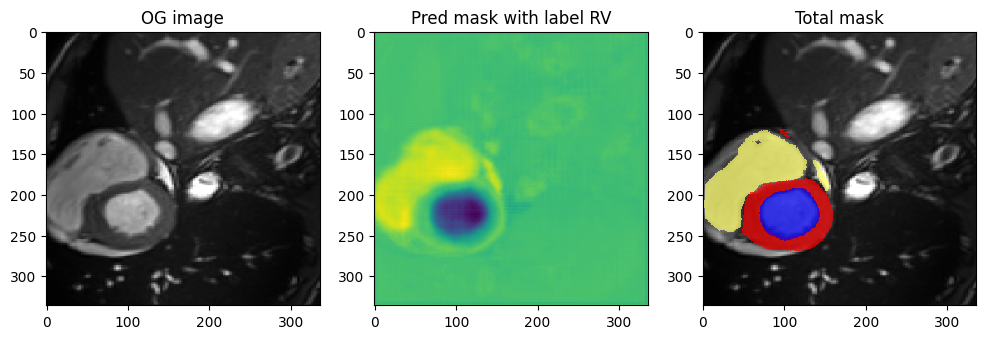

0


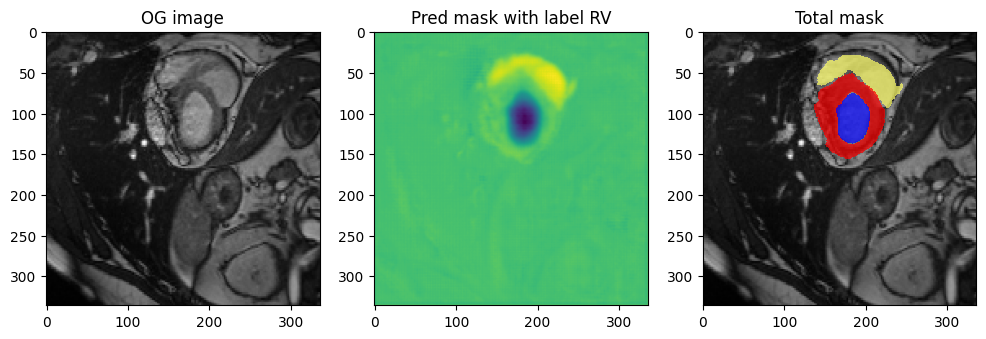

0


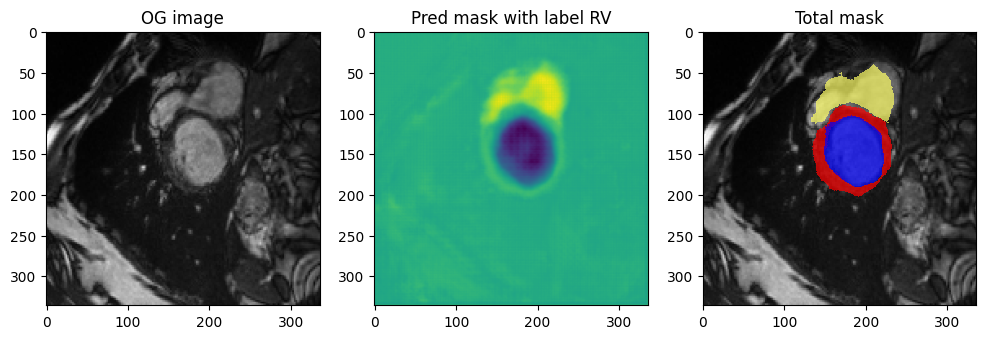

0


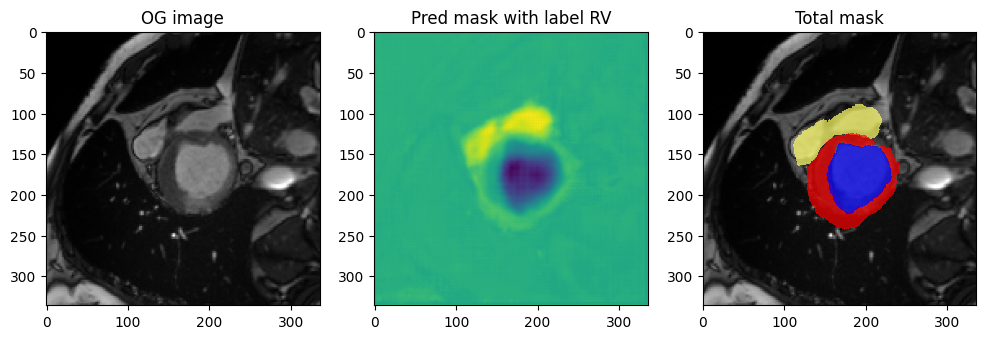

0


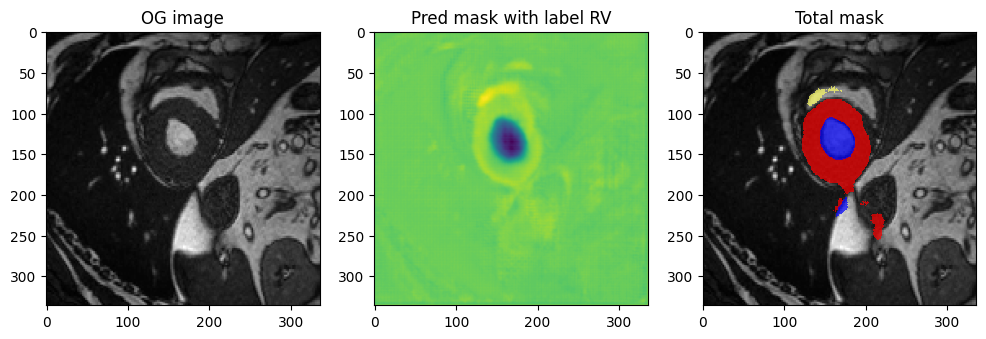

0


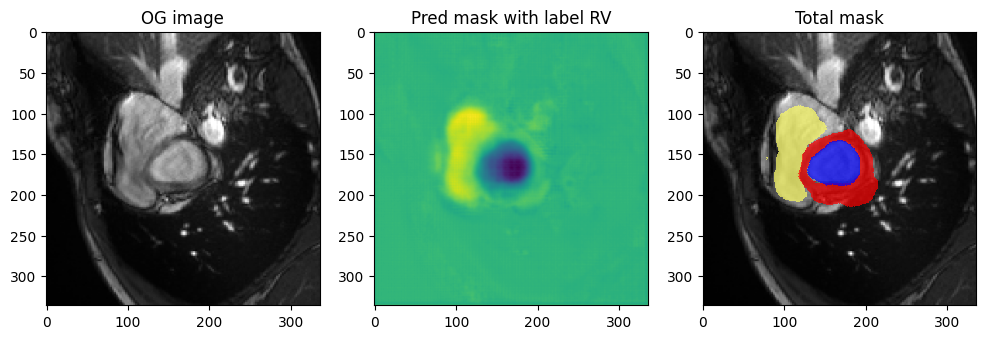

0


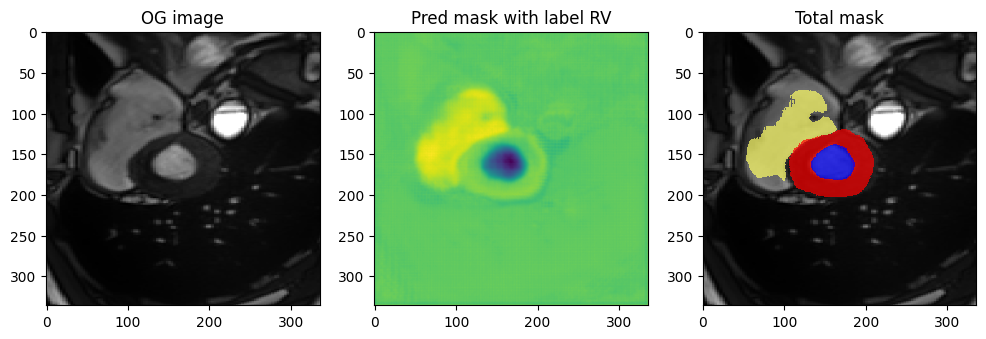

0


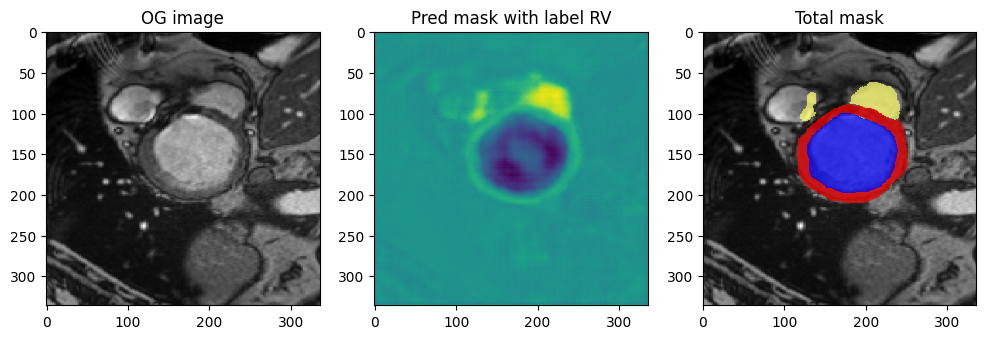

0


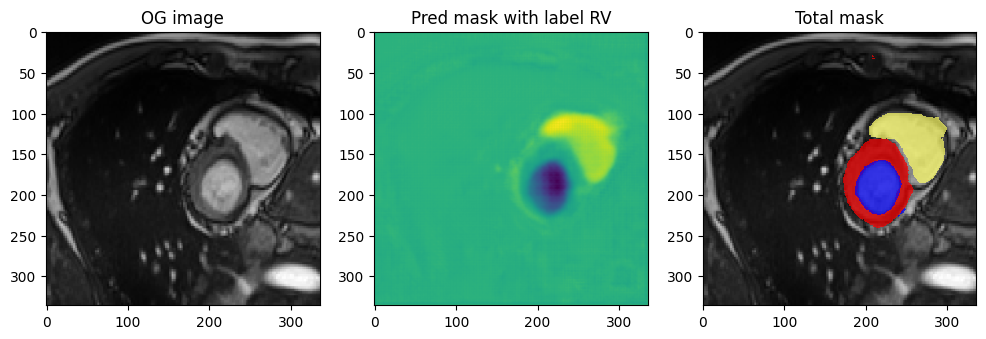

0


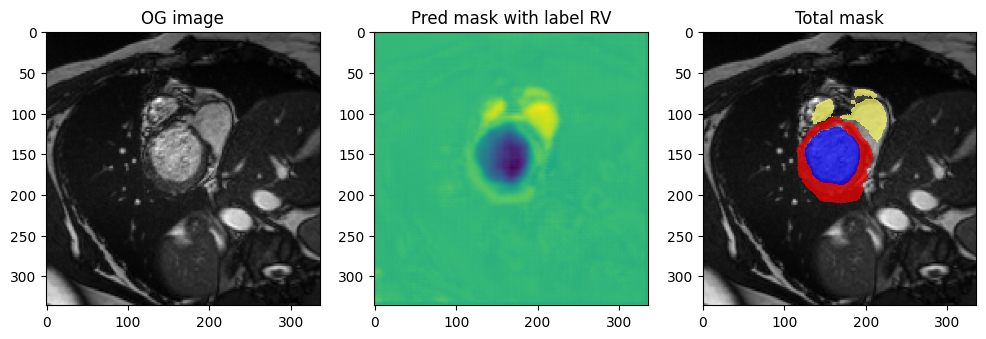

0


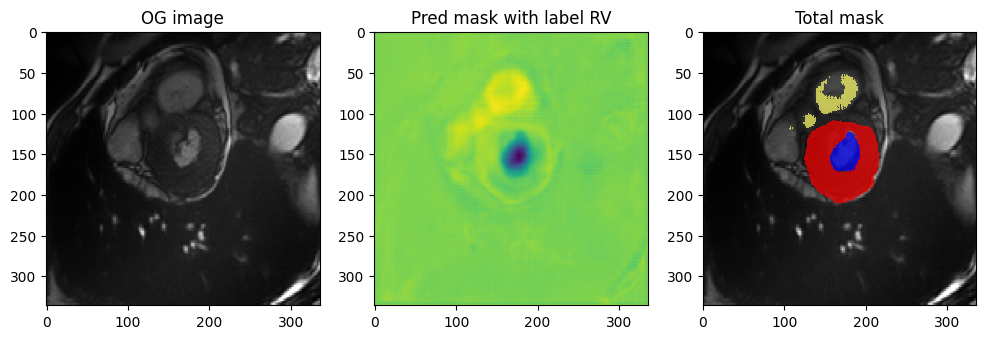

0


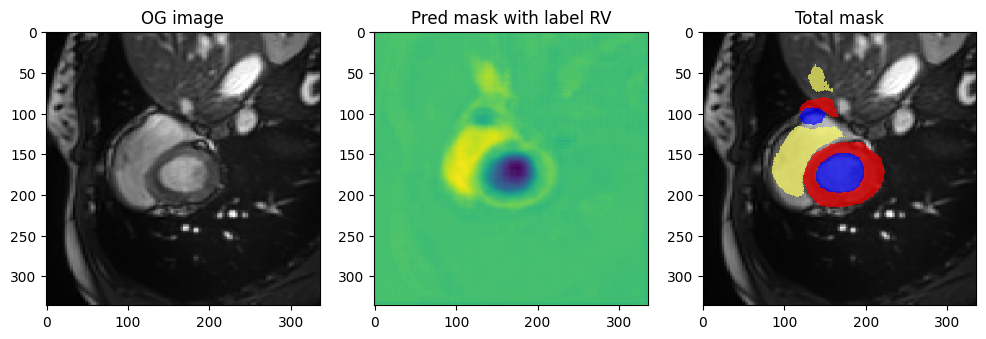

0


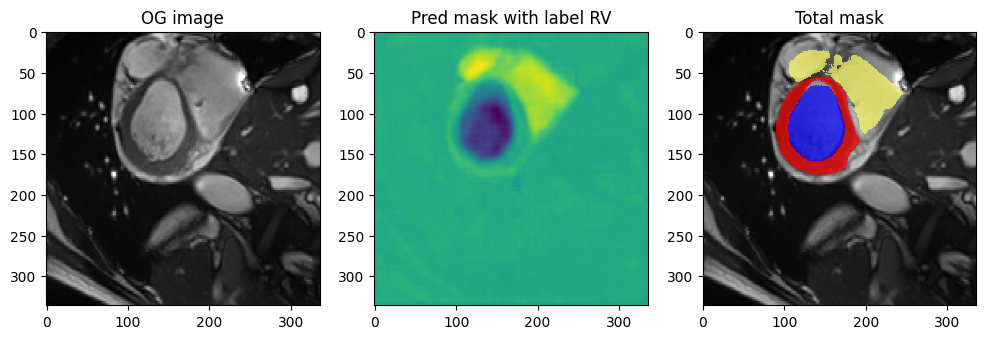

0


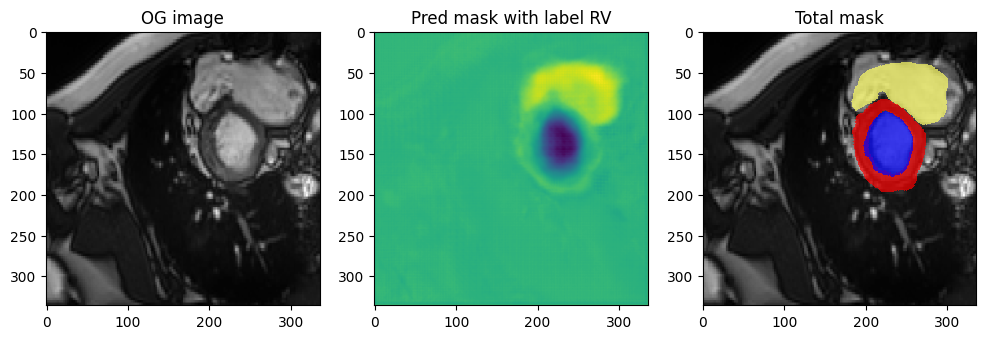

0


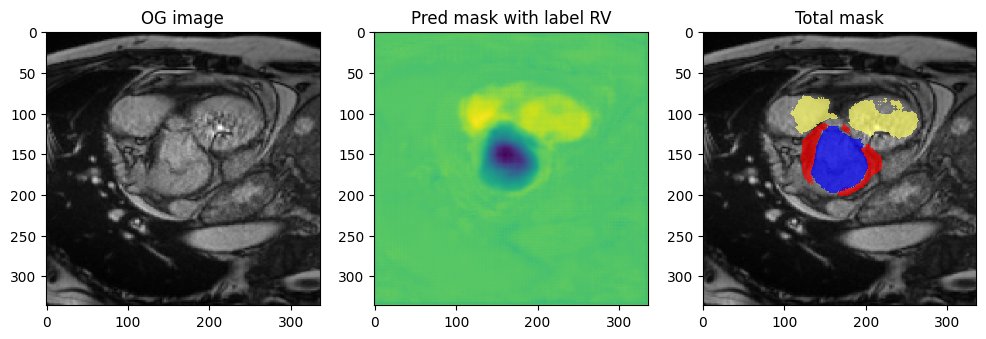

0


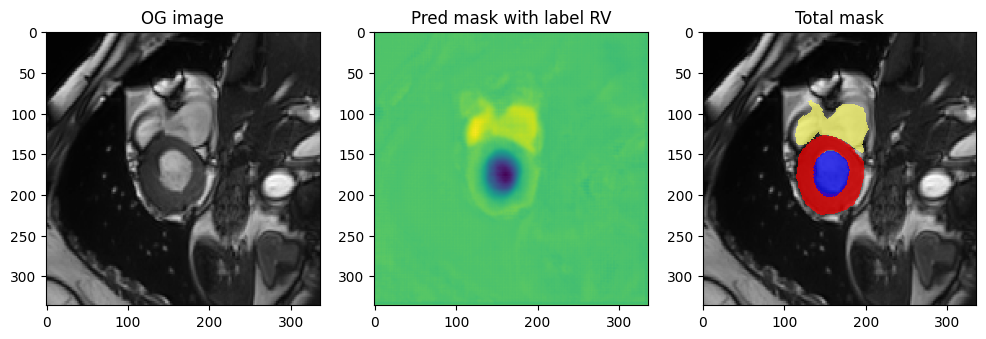

0


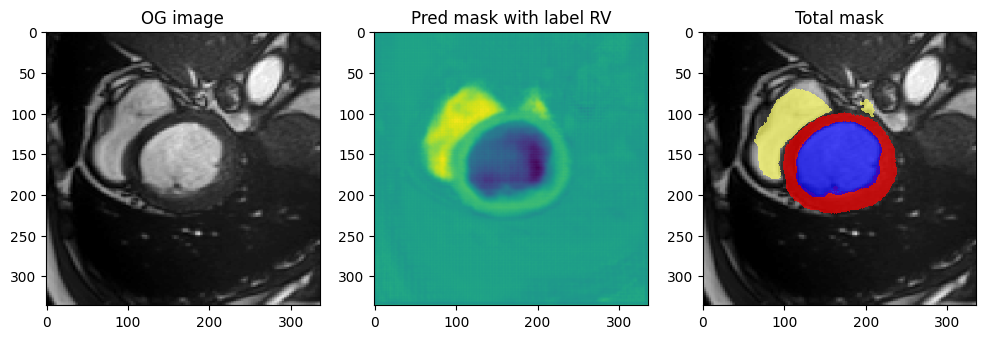

0


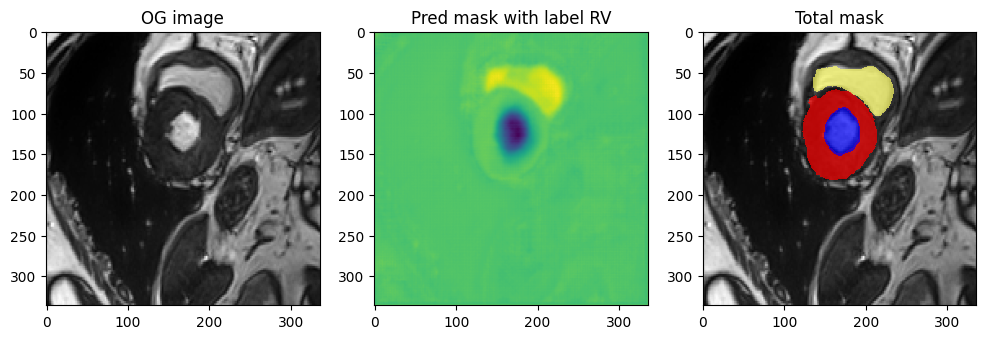

0


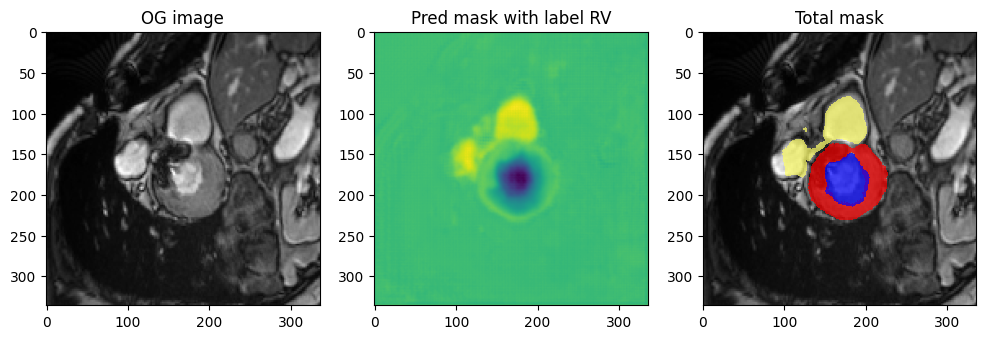

0


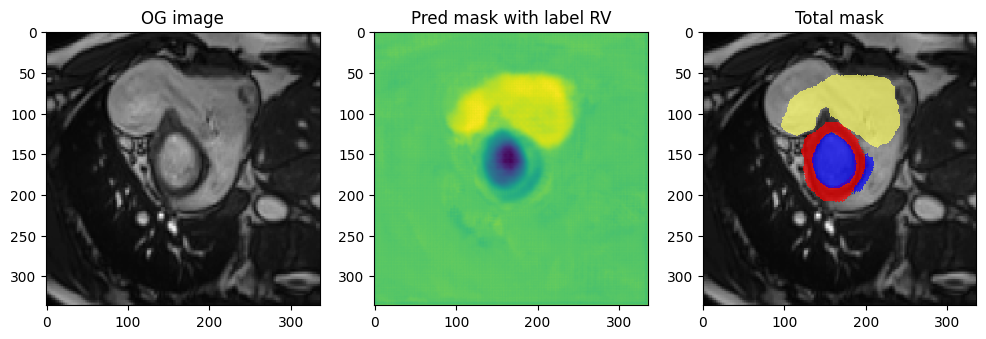

0


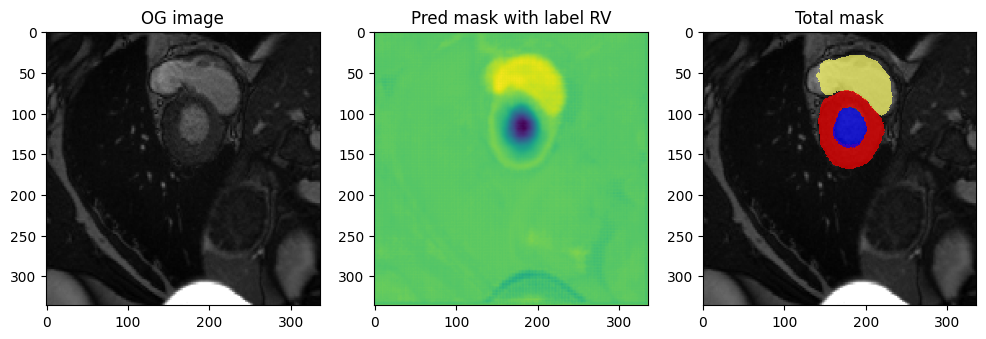

0


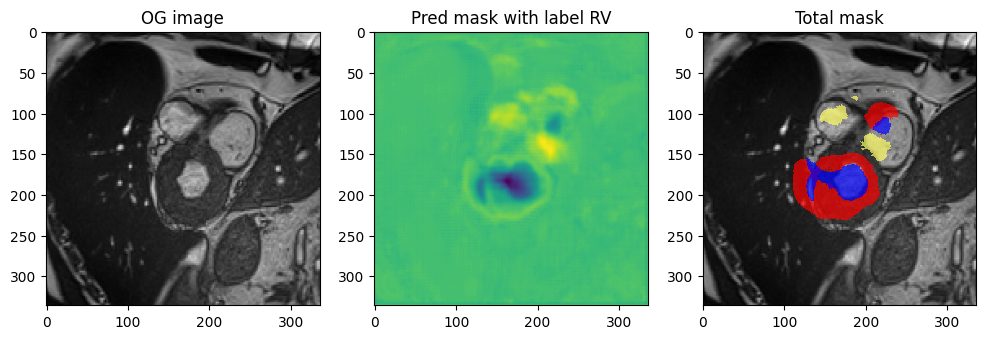

0


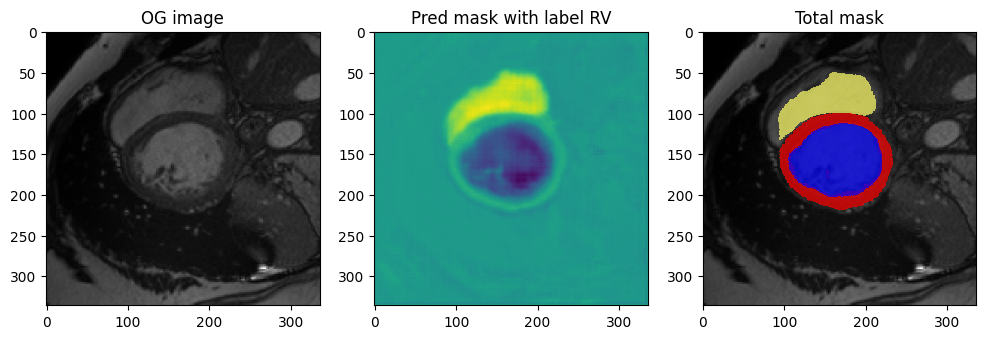

0


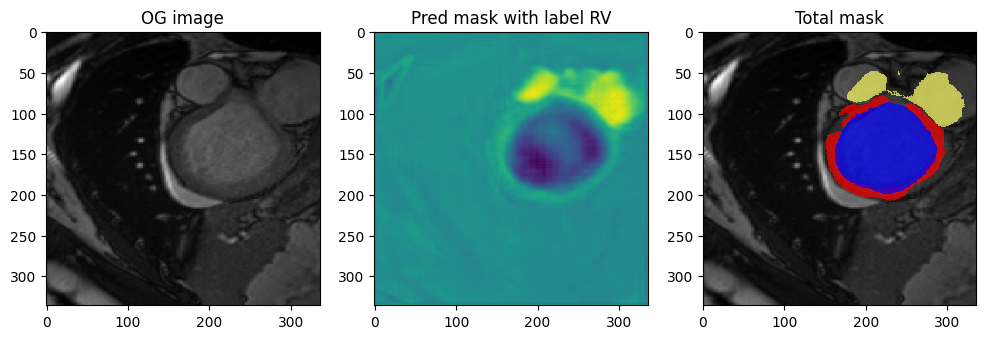

0


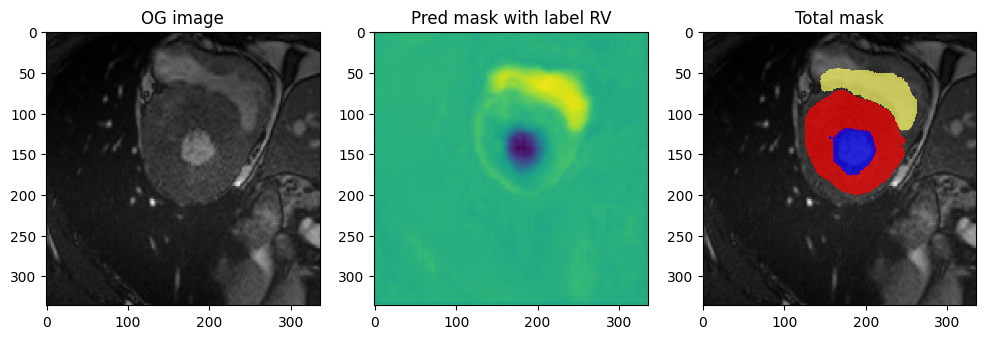

0


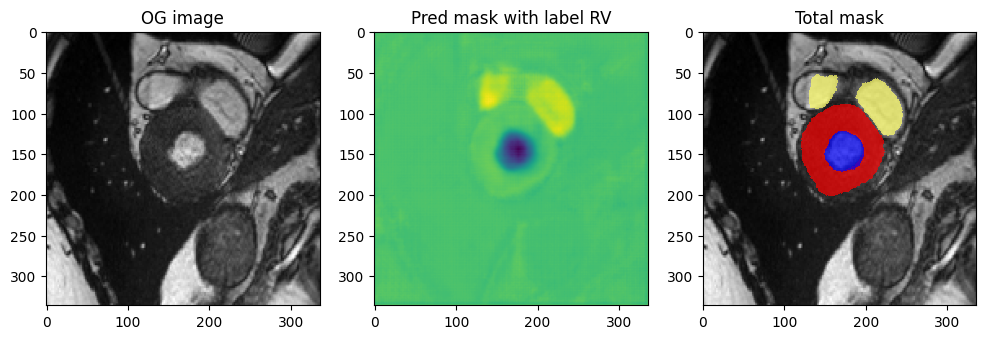

0


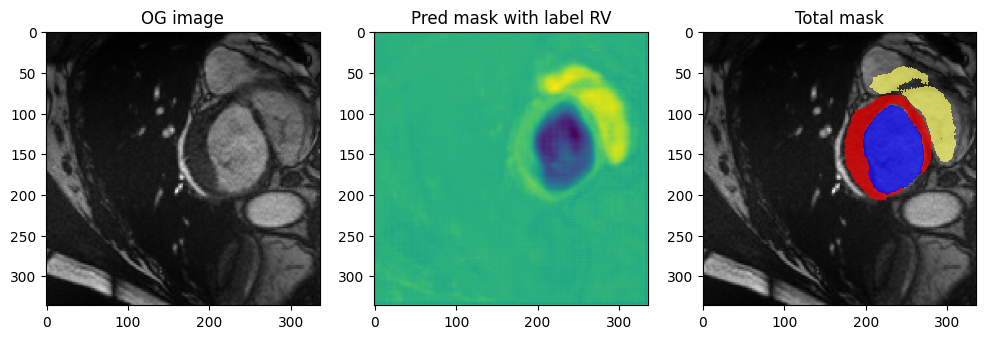

0


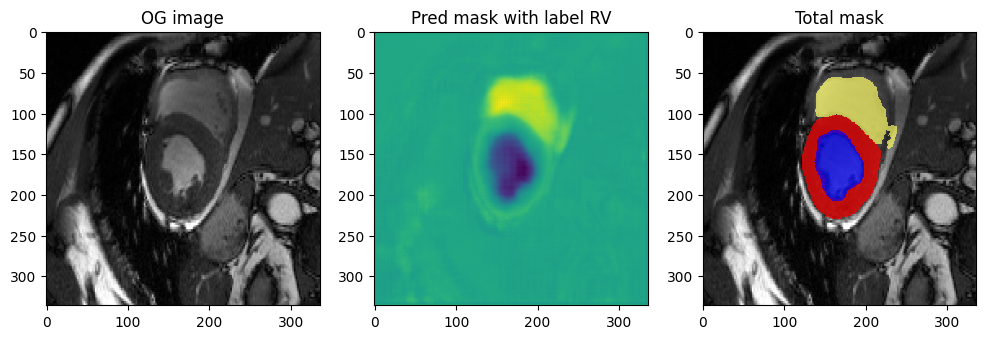

0


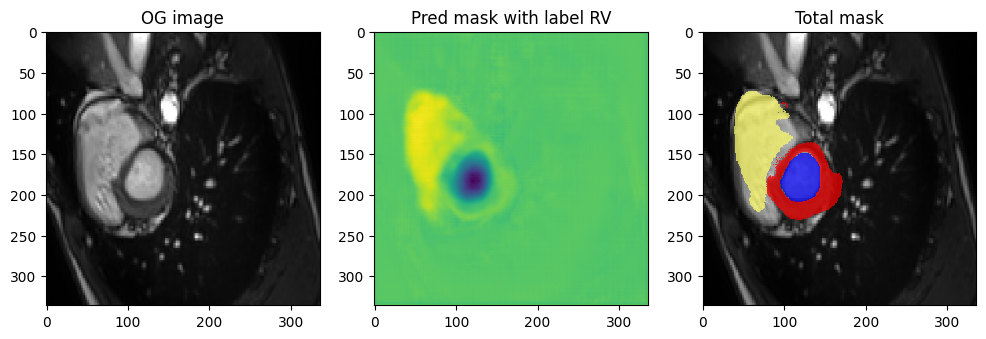

0


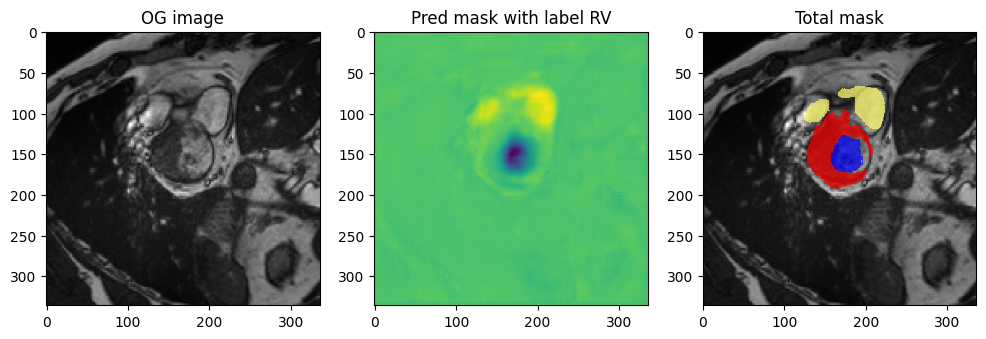

0


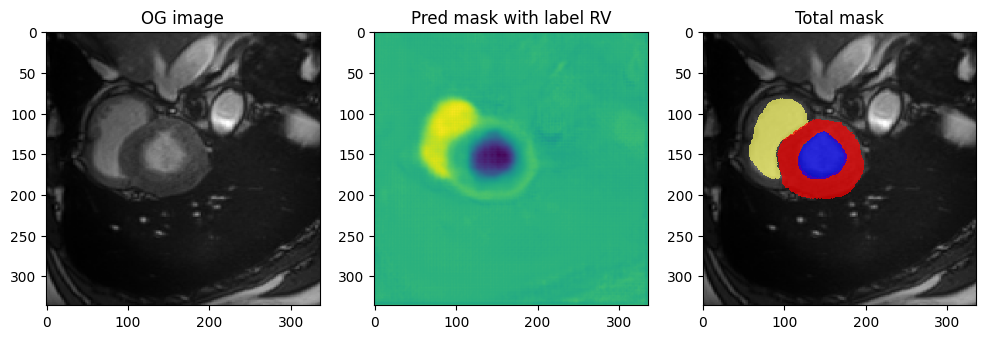

0


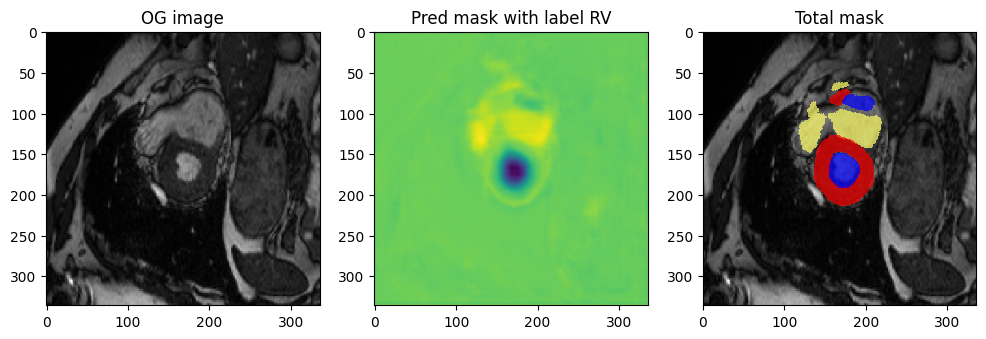

0


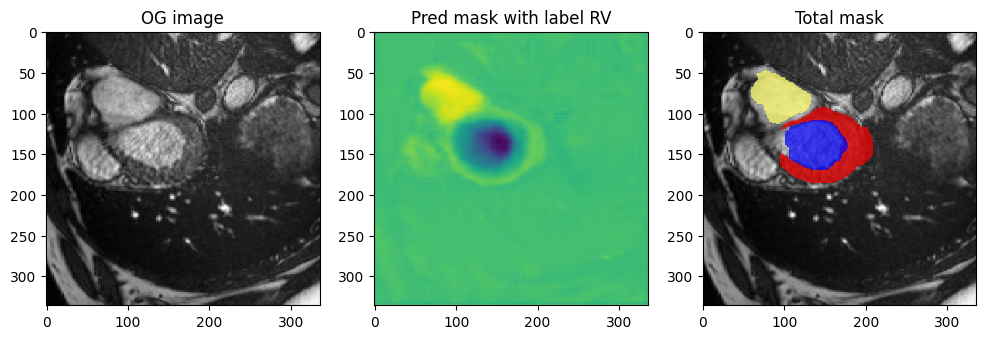

0


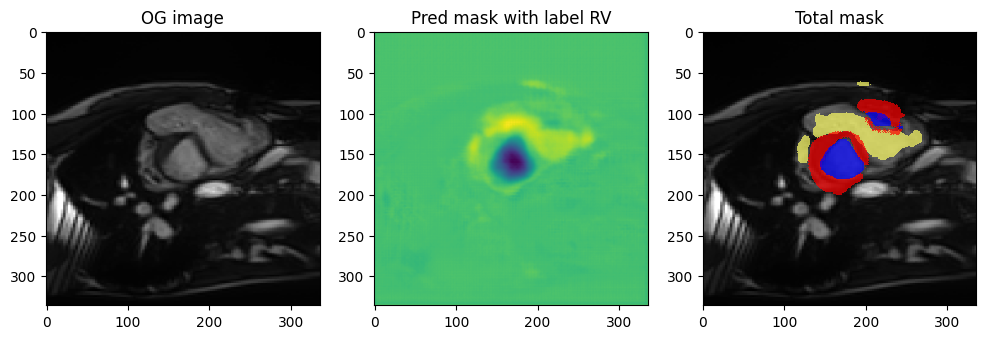

0


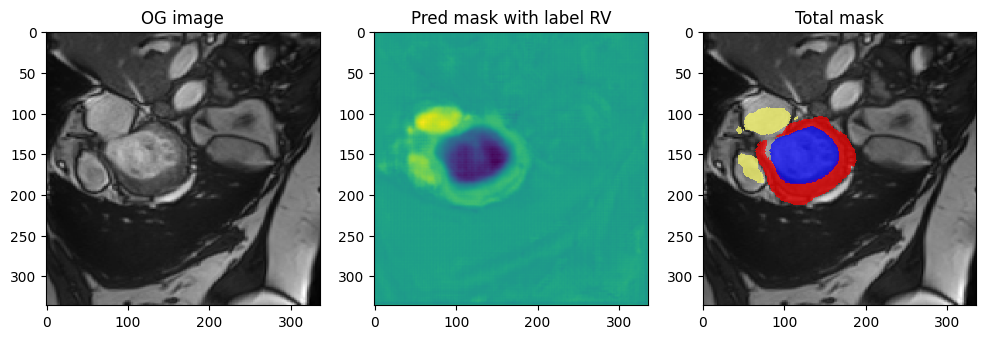

0


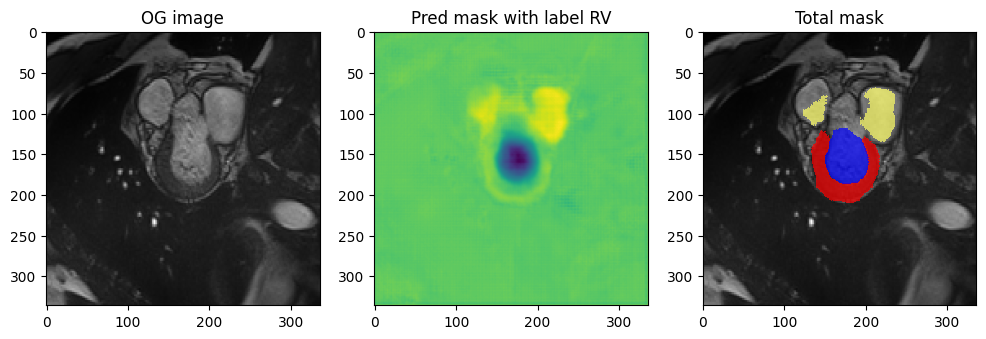

0


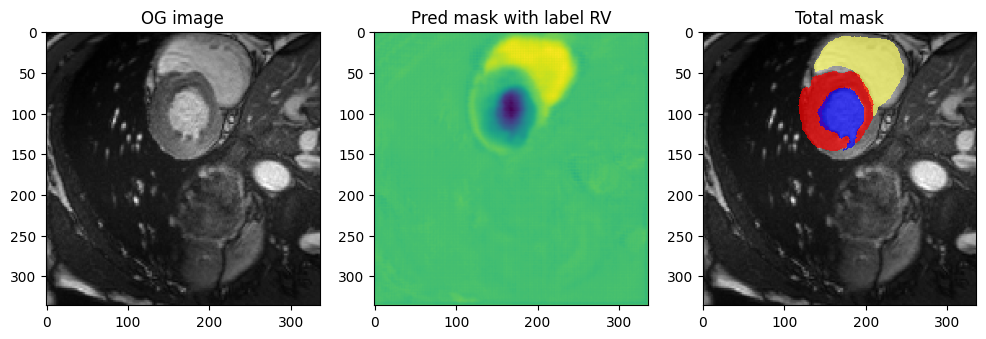

0


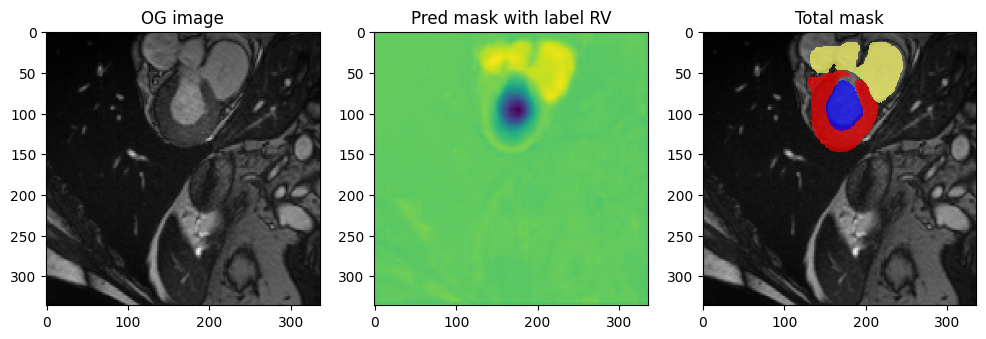

0


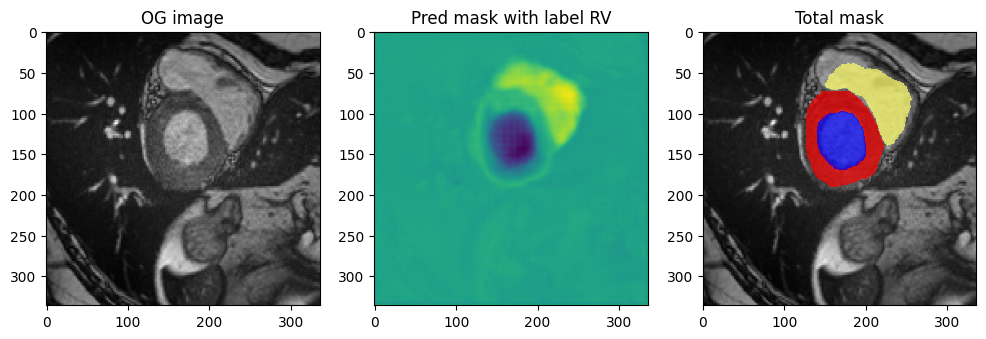

0


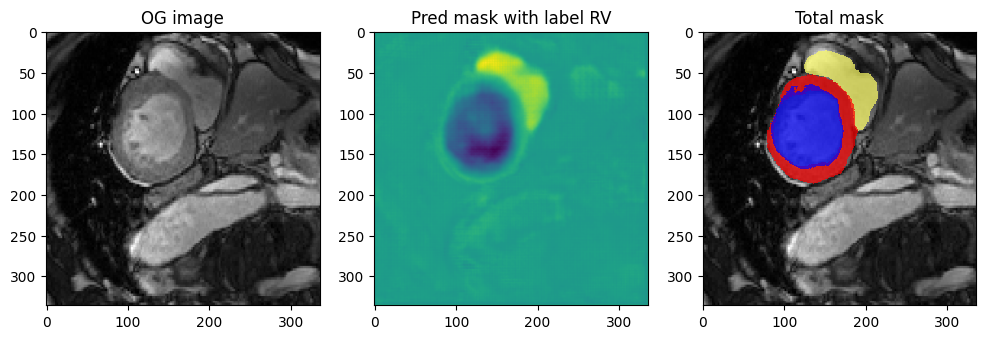

0


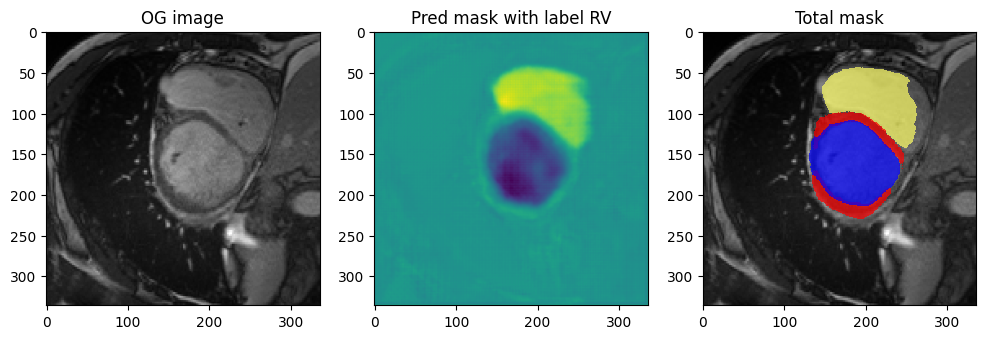

0


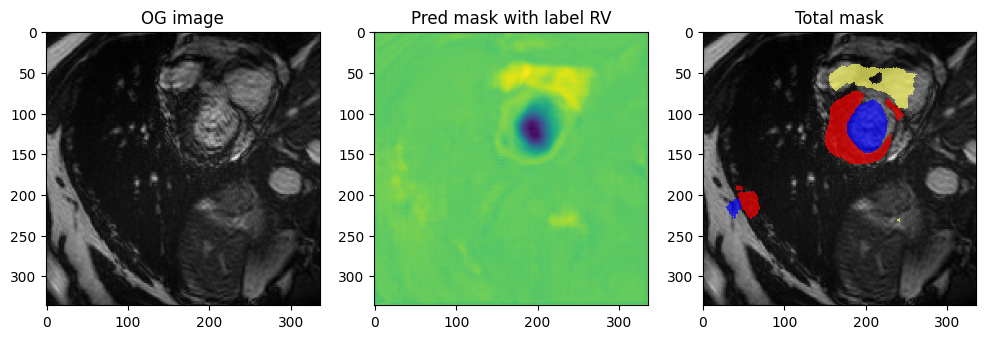

0


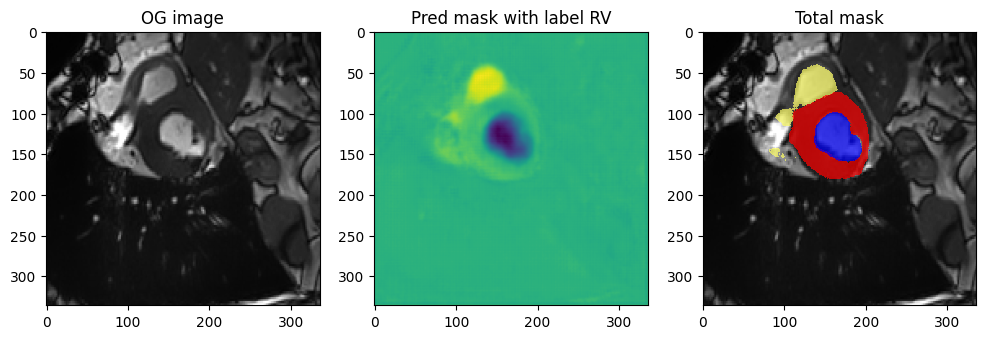

0


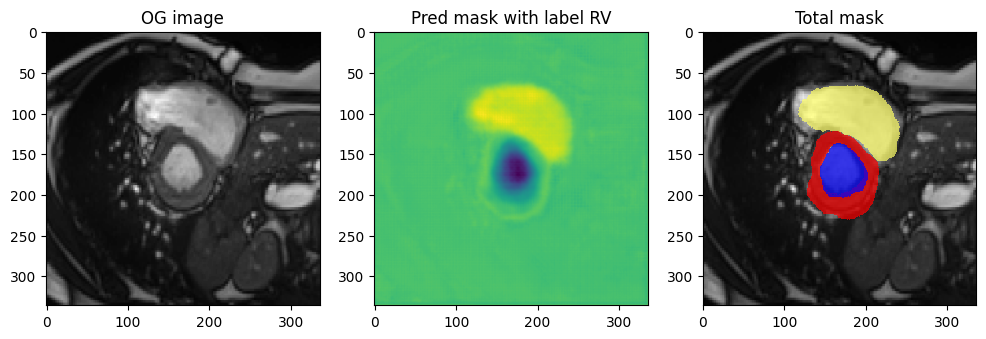

0


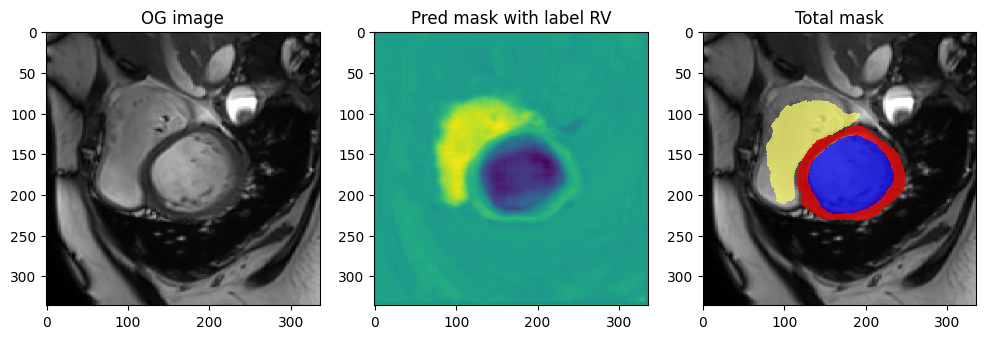

0


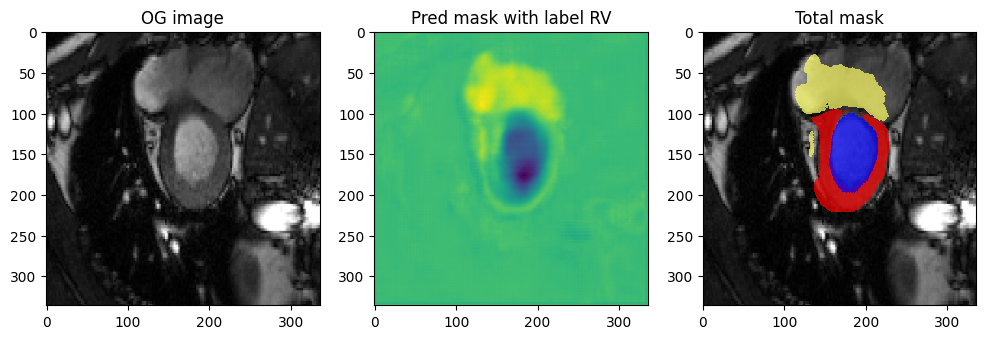

0


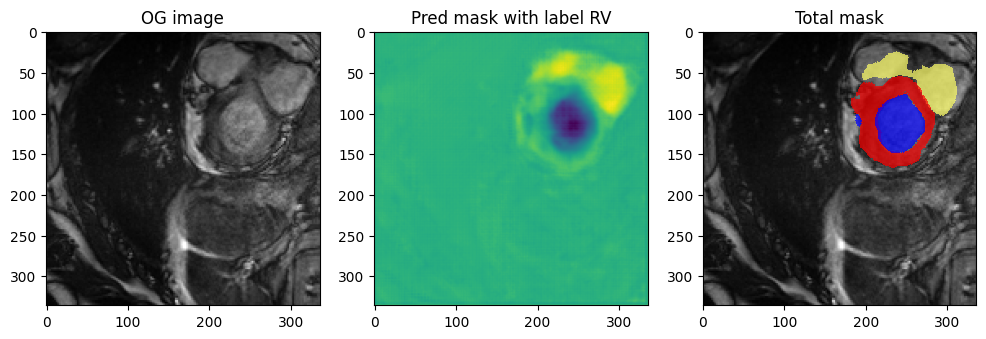

0


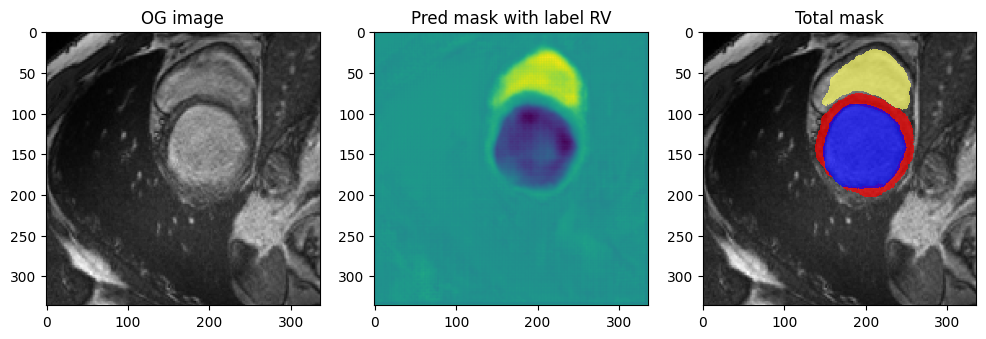

In [8]:
# Visualize a few results (only the segmentation and og image, not the gt mask because we didn't load that):

def visualize_results(state, slice, model, dataloader):
    model.eval()  # set the model to evaluation mode
    with torch.no_grad():  # turn off gradient computation bc we're not training anymore
        no_batches = len(test_dict)/batch_size # get the total number of batches: no_samples/batch_size
        no_batches = math.trunc(no_batches) # round down so you're certain you don't get a batch that doesn't exist
        batch = random.randrange(start=1, stop=no_batches) # generate random batch number within total number of batches
        
        # Get images and labels from the dataset, and push the images through the model to get an output image
        for batch in dataloader:
            images = batch[f'{state}_img'].float().to(device) 
            output = model(images)

            i = random.randrange(images.shape[0]) # generate random sample number for in batch
            print(i) # will now give 0 because batchsize = 1
            j = 0 # mask number, 0 1 or 2
            labelname = ['RV','MYO','LV']
            # Visualize the images, ground truth masks, and model output masks
            img = images[i,:,:,:].cpu().numpy()
            img = np.squeeze(img)
            pred_mask = output[i,j,:,:,:].cpu().numpy()
            # Squeeze the mask where you specified j for
            pred_mask = np.squeeze(pred_mask)
            
            # Plot only z-axis for now
            img_plane = img[:,:,slice]
            pred_mask_plane = pred_mask[:,:,slice]

            # Display the images and masks 
            fig, axes = plt.subplots(1, 3, figsize=(12, 4))
            axes[0].imshow(img_plane, cmap='gray')
            axes[0].set_title('OG image')
            
            axes[1].imshow(pred_mask_plane)
            axes[1].set_title(f'Pred mask with label {labelname[j]}')     
            
            # Visualisatie mbv sigmoids:
            sigmoid = torch.nn.Sigmoid()
            pred_mask0 = 1*torch.round(sigmoid(output[i,0,:,:,:])).cpu().numpy()
            pred_mask1 = 2*torch.round(sigmoid(output[i,1,:,:,:])).cpu().numpy()
            pred_mask2 = 3*torch.round(sigmoid(output[i,2,:,:,:])).cpu().numpy()
            overlay_mask0 = np.ma.masked_where(pred_mask0 == 0, pred_mask0 == 1) # this masks elements in the mask that are 0, and leaves elements that are 1 unmasked
            overlay_mask1 = np.ma.masked_where(pred_mask1 == 0, pred_mask1 == 1)
            overlay_mask2 = np.ma.masked_where(pred_mask2 == 0, pred_mask2 == 1)
            axes[2].imshow(img_plane, cmap='gray')
            axes[2].imshow(overlay_mask0[:,:,slice], 'summer', alpha=0.7, clim=[0, 1], interpolation='nearest')
            axes[2].imshow(overlay_mask1[:,:,slice], 'autumn', alpha=0.7, clim=[0, 1], interpolation='nearest')
            axes[2].imshow(overlay_mask2[:,:,slice], 'winter', alpha=0.7, clim=[0, 1], interpolation='nearest')
            axes[2].set_title('Total mask')
            plt.show() 

slice = 3 # slice in z-axis used for visualization
state = 'ED'
visualize_results(state,slice,model,test_dataloader)

In [9]:
# Get the segmentation results from the model and specified input data (dataloader)

def get_segmentation(state, model, dataloader):
    tot_pred_mask = [] #preallocate
    model.eval()  # set the model to evaluation mode
    with torch.no_grad():  # turn off gradient computation bc we're not training anymore
        no_batches = len(test_dict)/batch_size # get the total number of batches: no_samples/batch_size
        no_batches = math.trunc(no_batches) # round down so you're certain you don't get a batch that doesn't exist
        batch = random.randrange(start=1, stop=no_batches) # generate random batch number within total number of batches

        # Get images and labels from the dataset, and push the images through the model to get an output image. We're not interested in the ground truth mask.
        for batch in dataloader:
            images = batch[f'{state}_img'].float().to(device) # get images
            output = model(images)[0] # push images through the model to get segmentation results. [0] because batch channel is 1, so remove that
            
            # Apply sigmoid to output segmentation so that the masks are split into RV, MYO and LV
            sigmoid = torch.nn.Sigmoid()
            pred_mask0 = 1*torch.round(sigmoid(output[0,:,:,:])).cpu().numpy()
            pred_mask1 = 2*torch.round(sigmoid(output[1,:,:,:])).cpu().numpy()
            pred_mask2 = 3*torch.round(sigmoid(output[2,:,:,:])).cpu().numpy()
            pred_mask = np.add(np.add(pred_mask0, pred_mask1), pred_mask2)
            
            output = model(images)
            
            # # Apply softmax to output tensor
            output_softmax = torch.nn.functional.softmax(output, dim=1) # probability # dimension of the mask layers is 1 (counting from 0)
            output_argmax = torch.argmax(output_softmax, dim=1) # max van probability, output is indices over die as
            output_argmax = (output_argmax + 1).astype(np.int64)
            
            binary_masks = torch.round(sigmoid(output[0])).cpu().numpy() # make binary masks (still different layers)
            binary_mask = np.sum([binary_masks[0,:,:,:],binary_masks[1,:,:,:], binary_masks[2,:,:,:]],axis = 0)
            binary_mask = torch.from_numpy(binary_mask)
            binary_mask = torch.round(sigmoid(binary_mask)).cpu().numpy()
            binary_mask = np.expand_dims(binary_mask, axis=0)
            
            argbin = output_argmax*binary_mask
            tot_pred_mask.append(argbin)
            
    return tot_pred_mask

In [ ]:
# Transforming the output segmentation so it can be overlayed onto the original image
state = 'ED'  # make sure this corresponds to the results you're loading!
tot_pred_mask = get_segmentation('ED', model, test_dataloader)

# Path where the NIfTI images are saved
path = '/home/jovyan/Project/Val/ValidationResults/'
seg_ogsize_list = [] # preallocating
for i in range(len(tot_pred_mask)):
    # Load the original image and its header, affine transform and original size
    img = nib.load(test_dict[i][f'{state}_img'])
    
    test = test_dict[i][f'{state}_img']
    # Get the right name of the file
    patient_name = test[-25:]
    
    header = img.header
    affine = img.affine
    og_size = img.get_fdata()[:,:,:].shape

    # Now transform the segmentation result to the original size. In order for the Resize transform to work, a channel needs to be added first. This is not done in a compose transform since we're running over every image.
    seg_C = tot_pred_mask[i]
    T_P = monai.transforms.SpatialPad(spatial_size = [512, 512, 16], method = 'symmetric') # Pad the segmentation to the size it was cropped from. Since a CenterSpatialCrop was used, use symmetric padding on all sides
    seg_CP = T_P(seg_C) # apply the padding transform 
    T_R = monai.transforms.Resize(spatial_size = og_size, size_mode = 'all') # resize to original size
    seg_CPR = T_R(seg_CP) # apply the resize transform
    
    # Now make a nifti of the segmentation result and save it
    seg_nifti = nib.nifti1.Nifti1Image(seg_CPR[0], affine = affine, header = header) # [0] because you need to remove the first channel again
    nib.save(seg_nifti, path+patient_name)
    print('Done saving: ',path+patient_name)
print('Done saving')